In [8]:
import yfinance as yf
import pandas as pd

#define ticketers might change later
tickers = ["SPY", "BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BNB-USD"]

#companies that drive each ticker
drivers = {
    "SPY": ["Apple", "Microsoft", "Amazon"],
    "BTC-USD": ["Coinbase", "MicroStrategy", "Nvidia"],
    "ETH-USD": ["Coinbase", "Lido Finance", "Consensys"],
    "XRP-USD": ["Ripple", "Coinbase", "Binance"],
    "LTC-USD": ["Coinbase", "Antpool", "Bitmain"],
    "BNB-USD": ["Binance", "Binance Smart Chain projects", "Paxos"]
}

data = yf.download(
    tickers,
    period="5y",
    interval="1d",
    group_by="ticker",
    auto_adjust=False
)

stacked = (
    data.stack(level=0)  # Moves tickers into rows
        .reset_index()   # Convert index to columns
        .rename(columns={"level_1": "Ticker"})
)

# Calculate High - Low
stacked["Avg_HL"] = (stacked["High"] + stacked["Low"]) / 2

# Remove this useless ahh column
if "Price" in stacked.columns:
    stacked = stacked.drop(columns=["Price"])

# Add the Drivers column based on ticker values
stacked["Drivers"] = stacked["Ticker"].map(drivers)

# Sort real queick
stacked = stacked.sort_values(["Ticker", "Date"]).reset_index(drop=True)

stacked


[*********************100%***********************]  6 of 6 completed
C:\Users\jarne\AppData\Local\Temp\ipykernel_55344\1844033176.py:26: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  data.stack(level=0)  # Moves tickers into rows


Price,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Avg_HL,Drivers
0,2020-11-29,BNB-USD,29.164108,30.451855,28.959318,30.117603,30.117603,3.477730e+08,29.705586,"[Binance, Binance Smart Chain projects, Paxos]"
1,2020-11-30,BNB-USD,30.124310,31.533785,29.785835,31.392786,31.392786,3.896085e+08,30.659810,"[Binance, Binance Smart Chain projects, Paxos]"
2,2020-12-01,BNB-USD,31.411509,31.871908,29.484135,30.108303,30.108303,4.678190e+08,30.678021,"[Binance, Binance Smart Chain projects, Paxos]"
3,2020-12-02,BNB-USD,30.147505,30.910141,29.748901,30.297361,30.297361,3.714418e+08,30.329521,"[Binance, Binance Smart Chain projects, Paxos]"
4,2020-12-03,BNB-USD,30.303986,30.769117,29.978310,30.704430,30.704430,3.248976e+08,30.373713,"[Binance, Binance Smart Chain projects, Paxos]"
...,...,...,...,...,...,...,...,...,...,...
10381,2025-11-24,XRP-USD,2.046399,2.278396,2.026717,2.225878,2.225878,6.505730e+09,2.152556,"[Ripple, Coinbase, Binance]"
10382,2025-11-25,XRP-USD,2.226013,2.259399,2.151735,2.198544,2.198544,4.910341e+09,2.205567,"[Ripple, Coinbase, Binance]"
10383,2025-11-26,XRP-USD,2.198543,2.250157,2.148217,2.224285,2.224285,3.853144e+09,2.199187,"[Ripple, Coinbase, Binance]"
10384,2025-11-27,XRP-USD,2.224285,2.232725,2.175270,2.200824,2.200824,2.820875e+09,2.203997,"[Ripple, Coinbase, Binance]"


In [3]:
# Data Cleaning
# Convert 'Drivers' lists to strings (so drop_duplicates won't throw TypeError)
if "Drivers" in stacked.columns:
    stacked["Drivers"] = stacked["Drivers"].astype(str)

# Drop duplicates and rows missing key values
stacked = stacked.drop_duplicates().dropna(subset=["Date", "Ticker", "Close"])

# Ensure 'Date' is a datetime object and dropping rows where conversion didn't work
stacked["Date"] = pd.to_datetime(stacked["Date"], errors="coerce")
stacked = stacked.dropna(subset=["Date"])

# Sort for safety
stacked = stacked.sort_values(["Ticker", "Date"]).reset_index(drop=True)

# Make sure numerical columns are floats
numeric_cols = ["Open", "High", "Low", "Close", "Adj Close", "Volume", "Avg_HL"]
stacked[numeric_cols] = stacked[numeric_cols].apply(pd.to_numeric, errors="coerce")
stacked = stacked.dropna(subset=["Close", "Volume"])


In [14]:
import numpy as np

# Feature Creation for Analysis:
# These metrics help us quantify how each asset moves, how risky it is,
# and how it behaves compared to the S&P 500.

# Daily percentage change in closing price:
# shows how much the price changed from one day to the next
stacked["Daily_Return"] = (
    stacked.groupby("Ticker", sort=False)["Close"].pct_change()
)

# Log return based on daily change
# provides a more stable measure of growth and decline over time
stacked["Log_Return"] = np.log1p(stacked["Daily_Return"])

# Define the rolling window (30 days)
window = 30
g = stacked.groupby("Ticker", sort=False)

# Rolling volatility (standard deviation of log returns)
# captures how "bumpy" or risky each asset has been over the past 30 days
stacked["Rolling_Volatility"] = g["Log_Return"].transform(
    lambda s: s.rolling(window, min_periods=window).std()
)

# Rolling mean (30-day moving average of closing price)
# smooths short-term fluctuations to reveal overall trends
stacked["Rolling_Mean"] = g["Close"].transform(
    lambda s: s.rolling(window, min_periods=window).mean()
)

# Rolling maximum and drawdown
# measures how far the price has fallen from its most recent peak,helps us identify crash periods
stacked["Rolling_Max"] = g["Close"].transform("cummax")
stacked["Drawdown"] = (stacked["Close"] - stacked["Rolling_Max"]) / stacked["Rolling_Max"]

# Remove the earliest rows where rolling metrics cannot be calculated
stacked = stacked.dropna(subset=["Daily_Return", "Log_Return"]).reset_index(drop=True)


In [15]:
# Calculate how closely each cryptocurrency moves with the S&P 500
# helps identify when crypto behaves like the stock market and when it diverges
if "SPY" in stacked["Ticker"].unique():
    spy_lr = (
        stacked.loc[stacked["Ticker"] == "SPY", ["Date", "Log_Return"]]
        .set_index("Date")
        .rename(columns={"Log_Return": "SPY_LR"})
        .sort_index()
    )

    corr_rows = []
    for tk, df_tk in stacked.groupby("Ticker", sort=False):
        if tk == "SPY":
            continue
        s = df_tk[["Date", "Log_Return"]].set_index("Date").sort_index().rename(columns={"Log_Return": "Asset_LR"})
        aligned = s.join(spy_lr, how="inner")
        corr_series = aligned["Asset_LR"].rolling(window, min_periods=window).corr(aligned["SPY_LR"])
        corr_rows.append(
            corr_series.reset_index().assign(Ticker=tk).rename(columns={0: "Corr_with_SPY"})
        )

    corrs = pd.concat(corr_rows, ignore_index=True).rename(columns={0: "Corr_with_SPY"})
    stacked = stacked.merge(corrs, on=["Date", "Ticker"], how="left")

stacked


,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Avg_HL,Drivers,Daily_Return,Log_Return,Rolling_Volatility,Rolling_Mean,Rolling_Max,Drawdown,Corr_with_SPY
0,2020-11-30,BNB-USD,30.124310,31.533785,29.785835,31.392786,31.392786,3.896085e+08,30.659810,"[Binance, Binance Smart Chain projects, Paxos]",0.042340,0.041468,NaN,NaN,31.392786,0.000000,NaN
1,2020-12-01,BNB-USD,31.411509,31.871908,29.484135,30.108303,30.108303,4.678190e+08,30.678021,"[Binance, Binance Smart Chain projects, Paxos]",-0.040917,-0.041777,NaN,NaN,31.392786,-0.040917,NaN
2,2020-12-02,BNB-USD,30.147505,30.910141,29.748901,30.297361,30.297361,3.714418e+08,30.329521,"[Binance, Binance Smart Chain projects, Paxos]",0.006279,0.006260,NaN,NaN,31.392786,-0.034894,NaN
3,2020-12-03,BNB-USD,30.303986,30.769117,29.978310,30.704430,30.704430,3.248976e+08,30.373713,"[Binance, Binance Smart Chain projects, Paxos]",0.013436,0.013346,NaN,NaN,31.392786,-0.021927,NaN
4,2020-12-04,BNB-USD,30.716002,31.116619,28.925531,29.072208,29.072208,3.626268e+08,30.021075,"[Binance, Binance Smart Chain projects, Paxos]",-0.053159,-0.054624,NaN,NaN,31.392786,-0.073921,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10375,2025-11-24,XRP-USD,2.046399,2.278396,2.026717,2.225878,2.225878,6.505730e+09,2.152556,"[Ripple, Coinbase, Binance]",0.087776,0.084135,0.041352,2.315084,3.555765,-0.374009,0.547095
10376,2025-11-25,XRP-USD,2.226013,2.259399,2.151735,2.198544,2.198544,4.910341e+09,2.205567,"[Ripple, Coinbase, Binance]",-0.012280,-0.012356,0.041126,2.300197,3.555765,-0.381696,0.535541
10377,2025-11-26,XRP-USD,2.198543,2.250157,2.148217,2.224285,2.224285,3.853144e+09,2.199187,"[Ripple, Coinbase, Binance]",0.011708,0.011640,0.041253,2.286519,3.555765,-0.374457,0.556773
10378,2025-11-27,XRP-USD,2.224285,2.232725,2.175270,2.200824,2.200824,2.820875e+09,2.203997,"[Ripple, Coinbase, Binance]",-0.010548,-0.010604,0.041252,2.273014,3.555765,-0.381055,NaN


# Explanation of New Columns and Calculations

This section creates the main analytical features we’ll use in our visualizations.
Each one captures a different aspect of how an asset behaves — its daily movement,
its average trend, how volatile it is, and how it relates to the stock market.

1. Daily_Return
   - Formula: (Today’s Close – Yesterday’s Close) / Yesterday’s Close
   - Measures the day-to-day percent change in price.
   - Helps compare how frequently and sharply each asset moves up or down.
   - Useful for showing the difference in short-term price swings between crypto and the S&P 500.

2. Log_Return
   - Formula: log(1 + Daily_Return)
   - Provides a more stable version of returns where positive and negative changes
     are treated symmetrically.
   - Common in finance because it makes long-term growth and volatility easier to analyze
     and compare across different price levels.

3. Rolling_Volatility
   - Formula: Standard deviation of Log_Return over a 30-day window.
   - Represents how “bumpy” or risky the asset has been recently.
   - High volatility means the price has been changing a lot; low volatility means it’s steadier.
   - Directly answers our question about how much more volatile crypto is compared to stocks.

4. Rolling_Mean
   - Formula: 30-day moving average of the closing price.
   - Smooths out short-term fluctuations to highlight the broader trend.
   - Helps us visualize long-term growth, bubbles, and crashes without daily noise.

5. Rolling_Max
   - Formula: The highest closing price reached so far in the dataset for each asset.
   - Used to calculate drawdowns and identify when an asset is below its peak.

6. Drawdown
   - Formula: (Current Close – Rolling_Max) / Rolling_Max
   - Shows how far the asset has fallen from its most recent high (as a percentage).
   - Useful for pinpointing major crashes or corrections, like the 2020 COVID crash
     or the 2022–23 crypto winter.

7. Corr_with_SPY
   - Formula: 30-day rolling correlation between each asset’s Log_Return and SPY’s Log_Return.
   - Measures whether crypto and the stock market move together or separately.
   - Helps us see when crypto behaves like other risky assets (e.g., during market stress)
     and when it moves independently.

Together, these columns allow us to answer the three core research questions from our proposal:
- How much more volatile is crypto than the stock market?
- When do crypto and stock prices move together or drift apart?
- Which major events align with large shifts in volatility or co-movement?


In [6]:
#Sanity check that data makes sense

# average volatility per asset — crypto should appear higher than SPY
vol_summary = (
    stacked.groupby("Ticker")["Rolling_Volatility"]
    .median()
    .sort_values(ascending=False)
    .round(4)
)
print("Median Rolling Volatility by Ticker:\n", vol_summary)

# average daily return per asset
ret_summary = (
    stacked.groupby("Ticker")["Daily_Return"]
    .mean()
    .sort_values(ascending=False)
    .round(4)
)
print("\nAverage Daily Return by Ticker:\n", ret_summary)

# average drawdown (how deep typical drops are)
dd_summary = (
    stacked.groupby("Ticker")["Drawdown"]
    .mean()
    .sort_values(ascending=False)
    .round(4)
)
print("\nAverage Drawdown by Ticker:\n", dd_summary)


Median Rolling Volatility by Ticker:
 Ticker
LTC-USD    0.0390
XRP-USD    0.0390
ETH-USD    0.0366
BNB-USD    0.0302
BTC-USD    0.0273
SPY        0.0084
Name: Rolling_Volatility, dtype: float64

Average Daily Return by Ticker:
 Ticker
BNB-USD    0.0028
XRP-USD    0.0022
ETH-USD    0.0018
BTC-USD    0.0014
LTC-USD    0.0011
SPY        0.0006
Name: Daily_Return, dtype: float64

Average Drawdown by Ticker:
 Ticker
SPY       -0.0599
BTC-USD   -0.3194
BNB-USD   -0.3468
ETH-USD   -0.4193
XRP-USD   -0.5480
LTC-USD   -0.6910
Name: Drawdown, dtype: float64


Across all metrics, cryptocurrencies show higher volatility, larger drawdowns, and greater day-to-day movement compared to the S&P 500.
While their average daily returns are higher, the trade-off is extreme instability.
This pattern confirms that crypto behaves as a high-risk, high-reward asset class distinct from traditional equities

##Visualizations Below

In [12]:
#Visualization 4:
import altair as alt

# allow large datasets (more than 5000 rows)
alt.data_transformers.disable_max_rows()


# filter SPY + main crypto assets only
assets = ["SPY", "BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BNB-USD"]
df_vol = stacked[stacked["Ticker"].isin(assets)].copy()

vol_box = (
    alt.Chart(df_vol)
    .mark_boxplot(size=40)
    .encode(
        x=alt.X("Ticker:N", title="Asset"),
        y=alt.Y("Rolling_Volatility:Q", title="30-Day Rolling Volatility"),
        color=alt.Color("Ticker:N", legend=None),
        tooltip=[
            "Ticker",
            alt.Tooltip("Rolling_Volatility:Q", format=".4f", title="Volatility")
        ]
    )
    .properties(
        width=500,
        height=350,
        title="Volatility Distribution Across Assets"
    )
)

vol_box


alt.Chart(...)

**Figure IV:** Volatility Distribution Across Assets.  
*This figure compares the distribution of 30-day rolling volatility across SPY and five major cryptocurrencies, illustrating the wider and higher volatility ranges observed in crypto markets.*


**Interpretation**: Figure IV shows the distribution of 30-day rolling volatility for BNB-USD, BTC-USD, ETH-USD, LTC-USD, XRP-USD, and SPY. The x-axis lists each asset and the y-axis measures volatility, with the boxplots summarizing the central 50% of values and individual points marking more extreme observations. SPY has the lowest and tightest volatility range, with most values near 0.01. In contrast, all cryptocurrency assets display wider and higher distributions, especially XRP-USD and LTC-USD, which show frequent large spikes. Overall, the visualization indicates that cryptocurrencies experience substantially higher and more variable price fluctuations than the S&P 500.

In [ ]:
# Prepare data: filter relevant assets and create log volume
assets = ["SPY", "BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BNB-USD"]
df_vp = stacked[stacked["Ticker"].isin(assets)].copy()

# Create log-transformed volume (add 1 to avoid log(0))
df_vp["Log_Volume"] = np.log1p(df_vp["Volume"])

# Remove any remaining NaN values in key columns
df_vp = df_vp.dropna(subset=["Log_Volume", "Avg_HL", "Ticker"])

# Create a selection for interactive filtering by ticker
ticker_selection = alt.selection_point(fields=["Ticker"], bind="legend")

# Base scatter plot
scatter = (
    alt.Chart(df_vp)
    .mark_circle(size=20, opacity=0.4)
    .encode(
        x=alt.X("Log_Volume:Q",
                title="Log(Volume)",
                scale=alt.Scale(zero=False)),
        y=alt.Y("Avg_HL:Q",
                title="Average of High and Low Price",
                scale=alt.Scale(zero=False)),
        color=alt.Color("Ticker:N",
                       title="Asset",
                       scale=alt.Scale(scheme="category10")),
        opacity=alt.condition(ticker_selection, alt.value(0.6), alt.value(0.1)),
        tooltip=[
            alt.Tooltip("Date:T", format="%Y-%m-%d"),
            "Ticker:N",
            alt.Tooltip("Volume:Q", format=",.0f"),
            alt.Tooltip("Log_Volume:Q", format=".2f"),
            alt.Tooltip("Avg_HL:Q", format=".2f", title="Avg High-Low"),
            alt.Tooltip("Close:Q", format=".2f")
        ]
    )
    .add_params(ticker_selection)
)

# Regression lines for each ticker
regression = (
    alt.Chart(df_vp)
    .mark_line(size=3)
    .encode(
        x="Log_Volume:Q",
        y=alt.Y("Avg_HL:Q"),
        color=alt.Color("Ticker:N", legend=None),
        opacity=alt.condition(ticker_selection, alt.value(1), alt.value(0.2))
    )
    .transform_regression(
        "Log_Volume",
        "Avg_HL",
        groupby=["Ticker"],
        method="linear"
    )
)

# Combine scatter and regression
volume_price_chart = (
    (scatter + regression)
    .properties(
        width=700,
        height=400,
        title="Volume–Price Relationship: Trading Volume vs. Price Levels"
    )
    .configure_axis(
        labelFontSize=11,
        titleFontSize=12
    )
    .configure_legend(
        titleFontSize=12,
        labelFontSize=11
    )
    .interactive()
)

volume_price_chart

alt.LayerChart(...)

**Figure III:** Volume–Price Relationship Across Assets.  
*This scatter plot with regression lines examines the correlation between trading volume (log-transformed) and average price levels, revealing how market liquidity relates to asset valuation across SPY and major cryptocurrencies.*

**Interpretation**: Figure III displays the relationship between log-transformed trading volume (x-axis) and the average of daily high and low prices (y-axis) for SPY and five major cryptocurrencies. Each point represents a single trading day, colored by asset, with regression lines showing the overall trend for each ticker. The interactive legend allows users to highlight specific assets by clicking, while hover tooltips provide detailed information including date, volume, and price metrics.

The visualization reveals distinct patterns across asset classes. SPY exhibits a tight, linear relationship with relatively consistent volume levels and stable pricing, reflecting the mature liquidity of the S&P 500. In contrast, cryptocurrencies display more dispersed patterns with steeper regression slopes, particularly BTC-USD and ETH-USD, indicating that higher trading volumes often coincide with significantly elevated price levels. XRP-USD, LTC-USD, and BNB-USD show intermediate patterns with greater scatter, suggesting more volatile liquidity-price dynamics.

The nonlinear bursts visible in crypto assets—clusters of high-volume, high-price points—likely correspond to market events such as bull runs, major announcements, or periods of speculative trading. This contrasts with SPY's steadier relationship, where volume and price maintain a more predictable correlation. Overall, the chart illustrates that cryptocurrencies exhibit stronger liquidity-price sensitivity and more dramatic market activity surges compared to traditional equities.

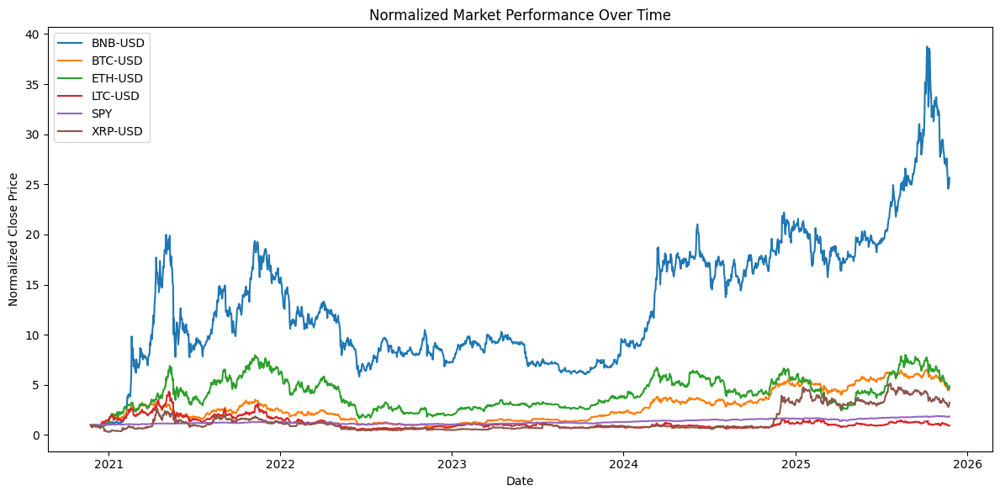

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Use the stacked dataframe
df_line = stacked.copy()

# Clean date + sort
df_line["Date"] = pd.to_datetime(df_line["Date"])
df_line = df_line.sort_values(["Ticker", "Date"])

# Normalize close prices
df_line["Norm_Close"] = (
    df_line.groupby("Ticker")["Close"].transform(lambda x: x / x.iloc[0])
)

# Line plot
plt.figure(figsize=(12,6))
for ticker, group in df_line.groupby("Ticker"):
    plt.plot(group["Date"], group["Norm_Close"], label=ticker)

plt.title("Normalized Market Performance Over Time")
plt.xlabel("Date")
plt.ylabel("Normalized Close Price")
plt.legend()
plt.tight_layout()
plt.show()


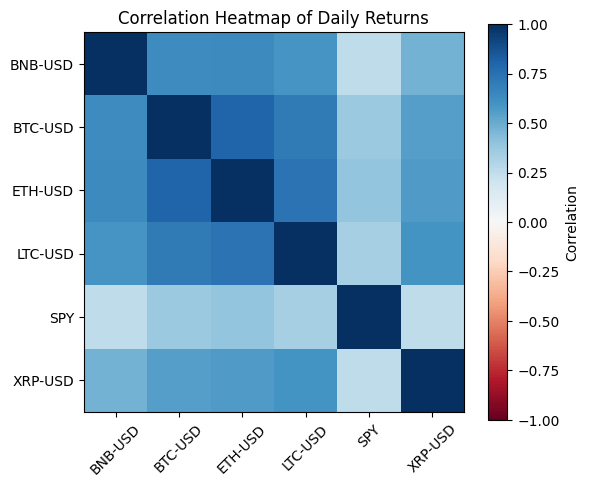

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load dataset
df = stacked.copy()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values(["Ticker", "Date"])

# Compute daily returns per ticker
df["Return"] = df.groupby("Ticker")["Close"].pct_change()

# Pivot to wide format for correlation
corr_wide = df.pivot(index="Date", columns="Ticker", values="Return")

# Compute correlation matrix
corr_matrix = corr_wide.corr()

# Plot heatmap
plt.figure(figsize=(6, 5))
plt.imshow(corr_matrix, cmap="RdBu", vmin=-1, vmax=1)
plt.colorbar(label="Correlation")

plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, rotation=45)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns)

plt.title("Correlation Heatmap of Daily Returns")
plt.tight_layout()
plt.show()
